In [48]:
from google.colab import drive
drive.mount('/content/drive')
data_path = '/content/drive/MyDrive/0.22__30'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Import packages

In [49]:
import torch
torch.cuda.empty_cache()

In [50]:
import torch
import numpy as np
import torch.nn as nn
from PIL import Image
from torchvision import transforms
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader
from torch.optim import Adam
import matplotlib.pyplot as plt
# import torchvision.transforms as transforms
# from mpl_toolkits.axes_grid1 import ImageGrid
# from torchvision.utils import save_image, make_grid

## Load Data

In [51]:
# Load and preprocess an image
image_paths = [f'{data_path}/{i}.jpg' for i in range(1, 51)]
# image_paths = ['path/to/image1.jpg', 'path/to/image2.jpg', 'path/to/image3.jpg']
images = [Image.open(image_path).convert('RGB') for image_path in image_paths]


preprocess = transforms.Compose([transforms.Resize((100, 100)),
                                 transforms.ToTensor(),
                                 transforms.Normalize(mean=[0.5],
                                                      std=[0.5])])
input_batch = torch.stack([preprocess(image) for image in images])



In [52]:
is_cuda = torch.cuda.is_available()
DEVICE = torch.device("cuda" if is_cuda else "cpu")
batch_size = 8

normalized_width = 100#224
normalized_height = 100#224
normalized_channels = 3

input_dim  = normalized_width * normalized_height * normalized_channels
print(input_dim)
hidden_dim = 4#200 #400
latent_dim = 5#100 #200

lr = 0.1 #1e-3

epochs = 3000

30000


In [53]:
train, valid = train_test_split(input_batch, test_size=0.2, random_state=1)

train_loader = DataLoader(dataset=train, batch_size=8, shuffle=True, num_workers=2)
test_loader  = DataLoader(dataset=valid,  batch_size=8, num_workers=2, shuffle=False)

## Visualization setup

In [54]:
# Function to visualize original and reconstructed images
def visualize_reconstructions(original, reconstructed, num_samples=8):
    plt.figure(figsize=(12, 4))
    for i in range(num_samples):
        plt.subplot(2, num_samples, i + 1)
        plt.imshow(original[i].reshape(100, 100, 3).detach().numpy())
        plt.axis('off')
        plt.title('Original')

        plt.subplot(2, num_samples, num_samples + i + 1)
        plt.imshow(reconstructed[i].reshape(100, 100, 3).detach().numpy())
        plt.axis('off')
        plt.title('Reconstructed')
    plt.show()

# Function to visualize latent space interpolation
def visualize_interpolation(model, x, num_samples=8):
    model.eval()
    with torch.no_grad():
        # data_iter = iter(data_loader)
        # x = next(data_iter)
        x_flat = x.view(-1, input_dim)
        _, mean, log_var = model(x_flat)
        z = model.reparameterization(mean, log_var)

        plt.figure(figsize=(12, 4))
        for i in range(num_samples):
            alpha = i / (num_samples - 1)
            z_interp = alpha * z[0] + (1 - alpha) * z[1]
            x_interp = model.decoder(z_interp)
            x_interp = x_interp.reshape(100, 100, 3).detach().numpy()

            plt.subplot(1, num_samples, i + 1)
            plt.imshow(x_interp)
            plt.axis('off')
            plt.title(f'Interpolation {i+1}')
        plt.show()

# Function to visualize latent space distribution
def visualize_latent_space_distribution(model, x):
    model.eval()
    with torch.no_grad():
        # data_iter = iter(data_loader)
        # x = next(data_iter)
        x_flat = x.view(-1, input_dim)
        _, mean, log_var = model(x_flat)
        z = model.reparameterization(mean, log_var)

        plt.figure(figsize=(8, 8))
        plt.scatter(z[:, 0], z[:, 1], c='b', marker='o', alpha=0.5)
        plt.title('Latent Space Distribution')
        plt.xlabel('Latent Dimension 1')
        plt.ylabel('Latent Dimension 2')
        plt.show()



# Create Standard VAE with prior from normal distribution

## Define Model

In [101]:
class Model(nn.Module):

    def __init__(self, input_dim):
        super(Model, self).__init__()
        # encoder
        self.encode_seq = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.LeakyReLU(0.2),
            nn.Linear(hidden_dim, latent_dim),
            nn.LeakyReLU(0.2)
            )
        # latent mean
        self.mean = nn.Linear(latent_dim, 2).to(DEVICE)
        # log variance
        self.log_var = nn.Linear(latent_dim, 2).to(DEVICE)

        # decoder
        self.decoder = nn.Sequential(
            nn.Linear(2, latent_dim),
            nn.LeakyReLU(0.2),
            nn.Linear(latent_dim, hidden_dim),
            nn.LeakyReLU(0.2),
            nn.Linear(hidden_dim, input_dim),
            nn.Sigmoid()
            ).to(DEVICE)

    def reparameterization(self, mean, var):
        epsilon = torch.randn_like(var)
        epsilon = epsilon.to(DEVICE)
        z = mean + var * epsilon
        # z = z.to(DEVICE)
        return z


    def forward(self, x):
        encoded = self.encode_seq(x).to(DEVICE)
        mean = self.mean(encoded).to(DEVICE)

        # print(f"self.mean {self.mean.type()}")
        log_var = self.log_var(encoded).to(DEVICE)

        z = self.reparameterization(mean, torch.exp(0.5 * log_var))
        x_hat = self.decoder(z).to(DEVICE)
        return x_hat, mean, log_var


In [102]:
model = Model(input_dim=input_dim).to(DEVICE)
# batch_size = 8
# input_dim = 30000

## Define Loss

In [103]:
optimizer = Adam(model.parameters(), lr=0.1)

def loss_function(x, x_hat, mean, log_var):
    """
    Compute the VAE loss, which includes a reconstruction term and a KL divergence term.
    The KL divergence is a metric used to
    measure the distance between two probability distributions.

    Args:
        x (torch.Tensor): Input tensor.
        x_hat (torch.Tensor): Reconstructed output tensor.
        mean (torch.Tensor): Mean of the latent space distribution.
        log_var (torch.Tensor): Log variance of the latent space distribution.

    Returns:
        torch.Tensor: Total VAE loss.
    """
    # Ensure that x is between 0 and 1
    if (x < 0).any() or (x > 1).any():
        raise ValueError("Input x should be between 0 and 1.")

    # Reconstruction loss
    reconstruction_loss = nn.functional.binary_cross_entropy(x_hat, x, reduction='sum')

    # KL divergence loss
    kl_divergence_loss = -0.5 * torch.sum(1 + log_var - mean.pow(2) - log_var.exp())

    # Combine the two terms
    total_loss = reconstruction_loss + kl_divergence_loss

    return total_loss



## Train Audoencoder

Start training VAE...
	Epoch 1 complete! 	Average KLD:  tensor(13.2084, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(20574.1836, grad_fn=<DivBackward0>) 	Average Loss:  20587.391796875


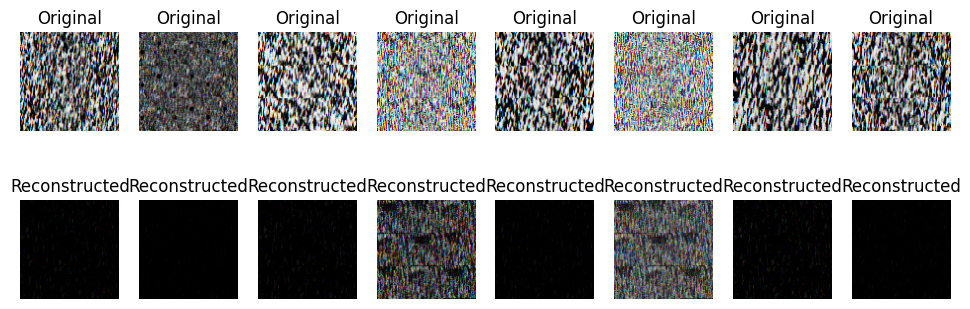

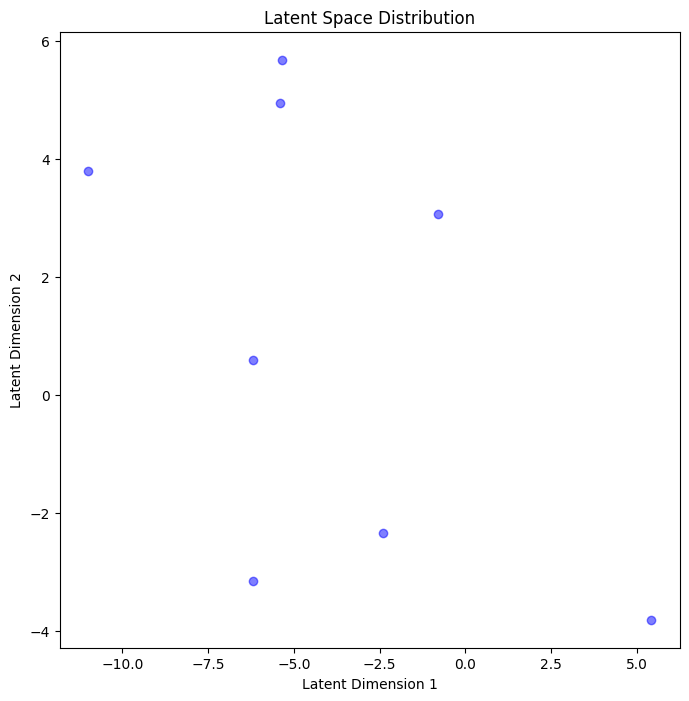

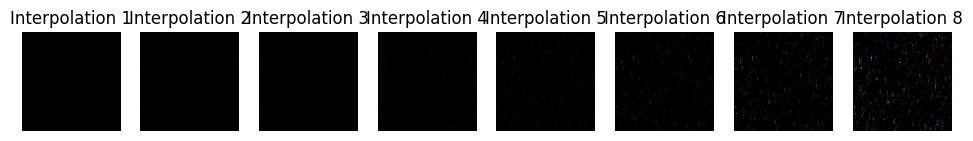

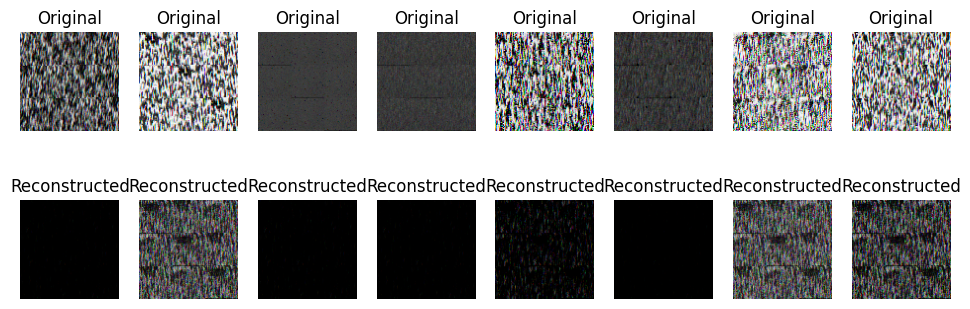

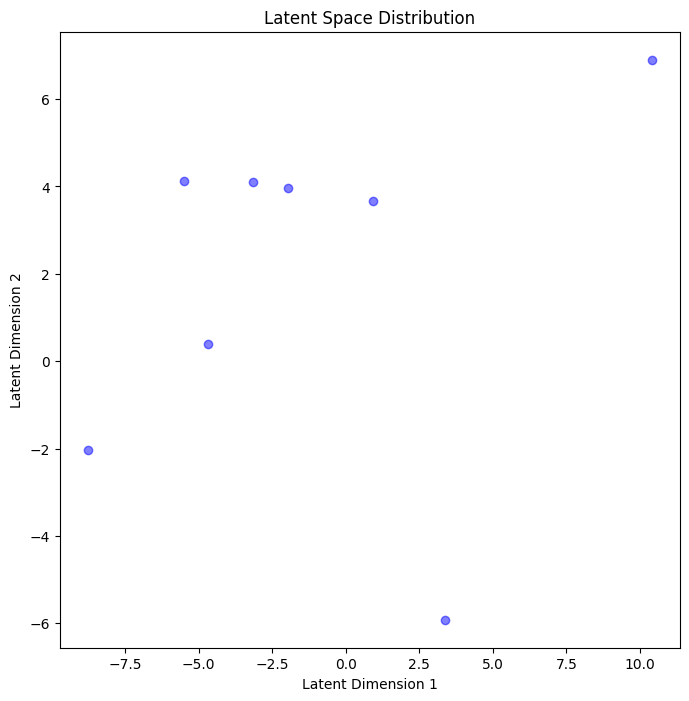

...

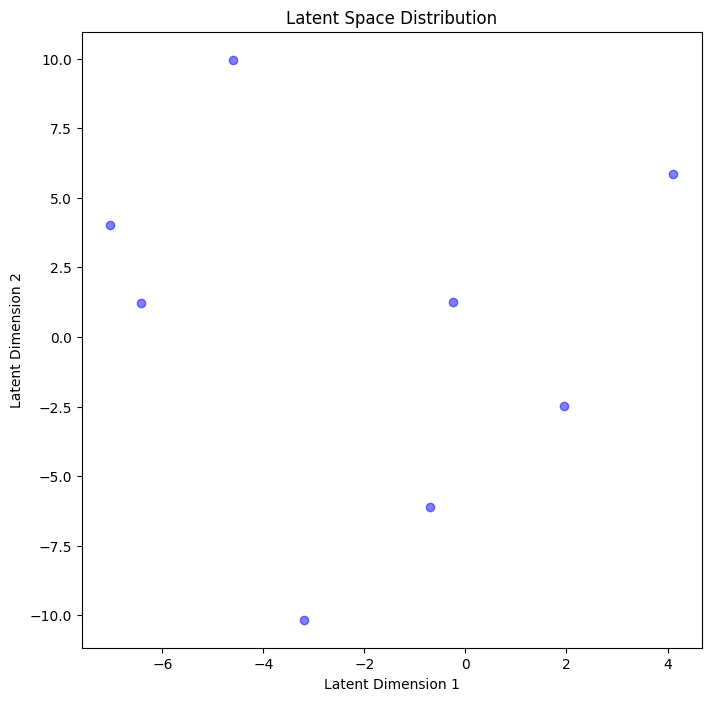

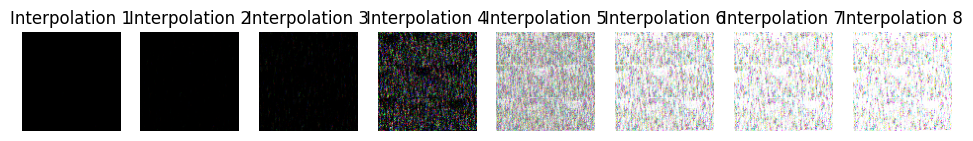

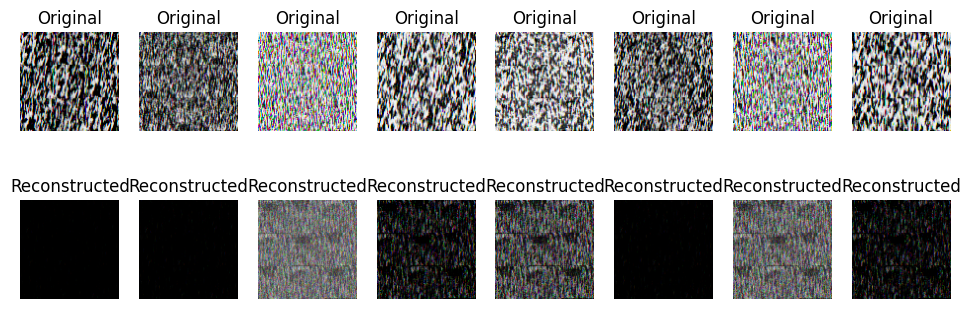

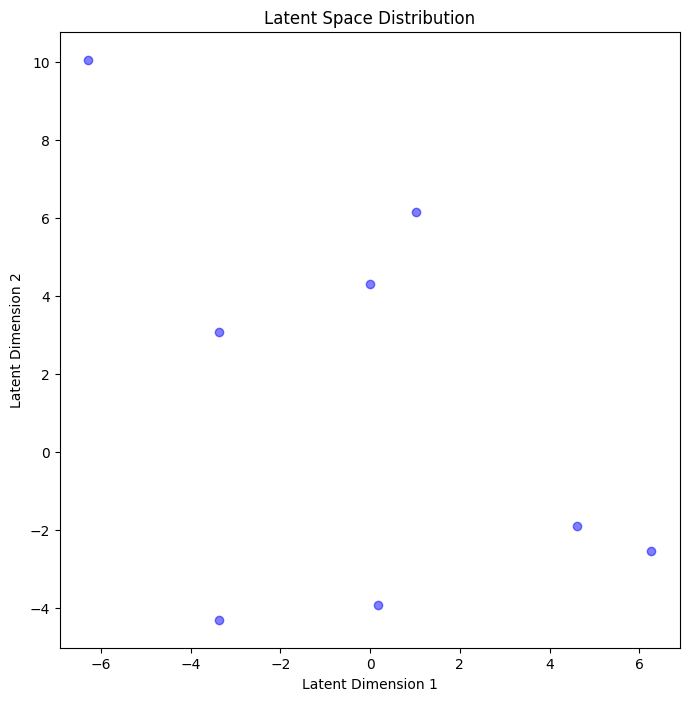

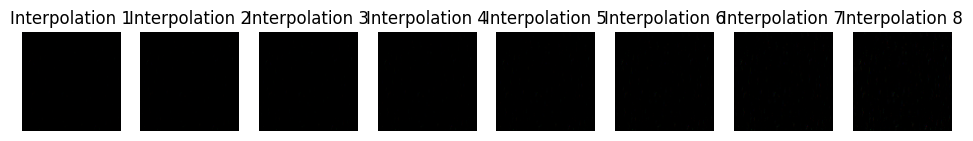

	Epoch 2 complete! 	Average KLD:  tensor(13.2183, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(20572.4336, grad_fn=<DivBackward0>) 	Average Loss:  20585.650390625
	Epoch 3 complete! 	Average KLD:  tensor(13.3387, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(20573.2695, grad_fn=<DivBackward0>) 	Average Loss:  20586.609375
	Epoch 4 complete! 	Average KLD:  tensor(13.4509, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(20574.2363, grad_fn=<DivBackward0>) 	Average Loss:  20587.687109375
	Epoch 5 complete! 	Average KLD:  tensor(13.5323, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(20572.5781, grad_fn=<DivBackward0>) 	Average Loss:  20586.11015625
	Epoch 6 complete! 	Average KLD:  tensor(13.3824, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(20574.2812, grad_fn=<DivBackward0>) 	Average Loss:  20587.663671875
	Epoch 7 complete! 	Average KLD:  tensor(13.1285, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(20573.0859, grad_fn=<DivBackward0>) 	Ave

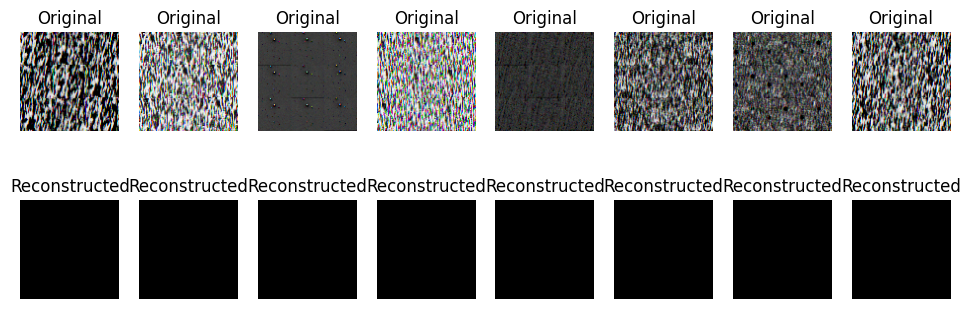

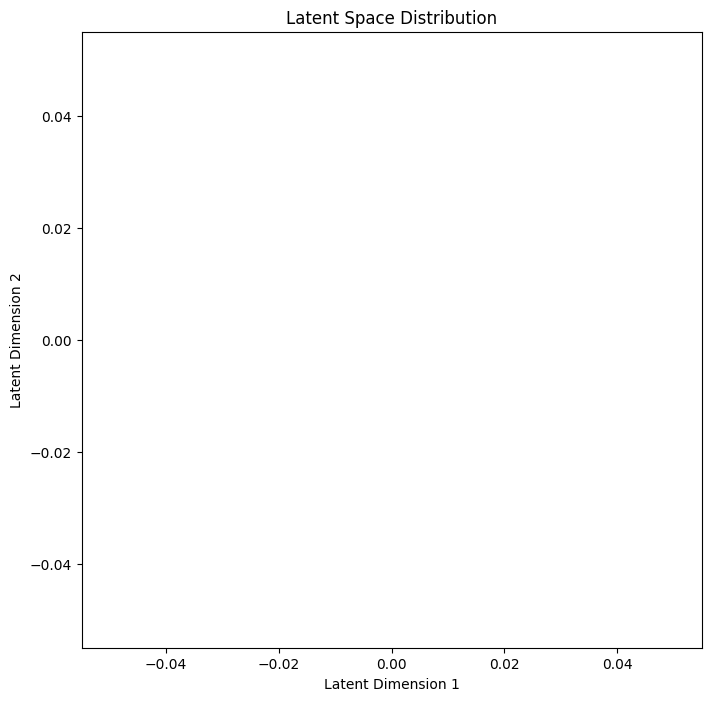

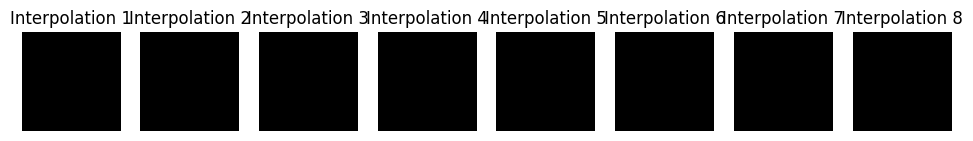

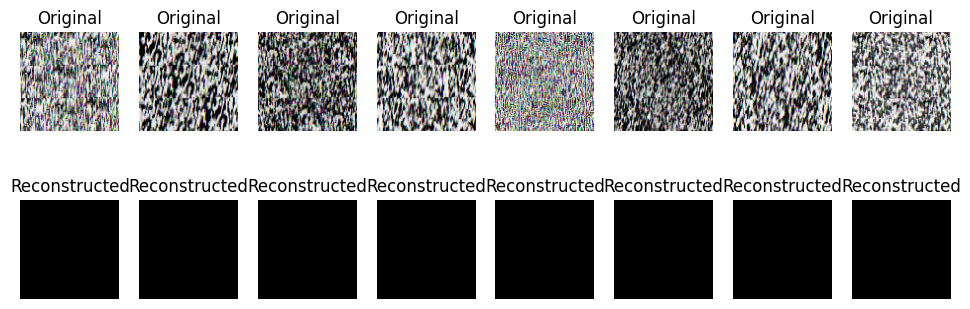

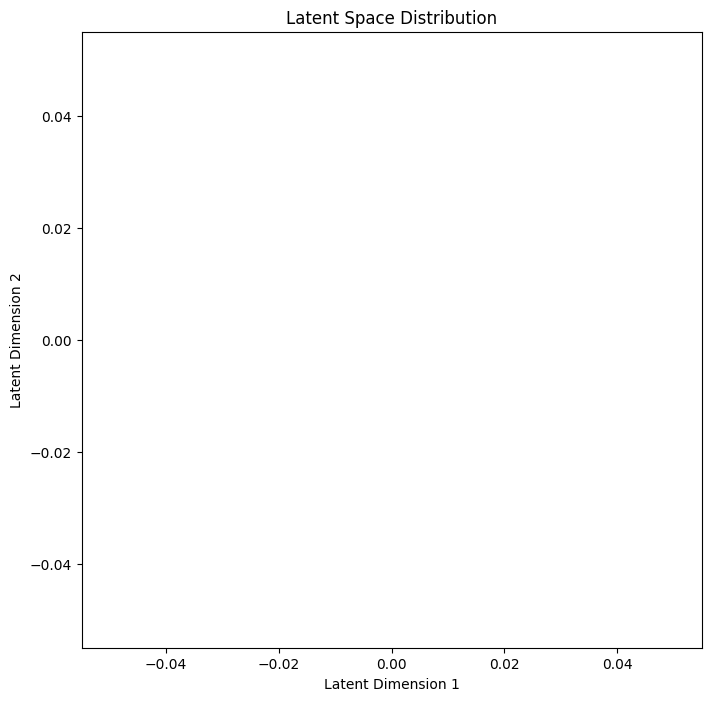

...

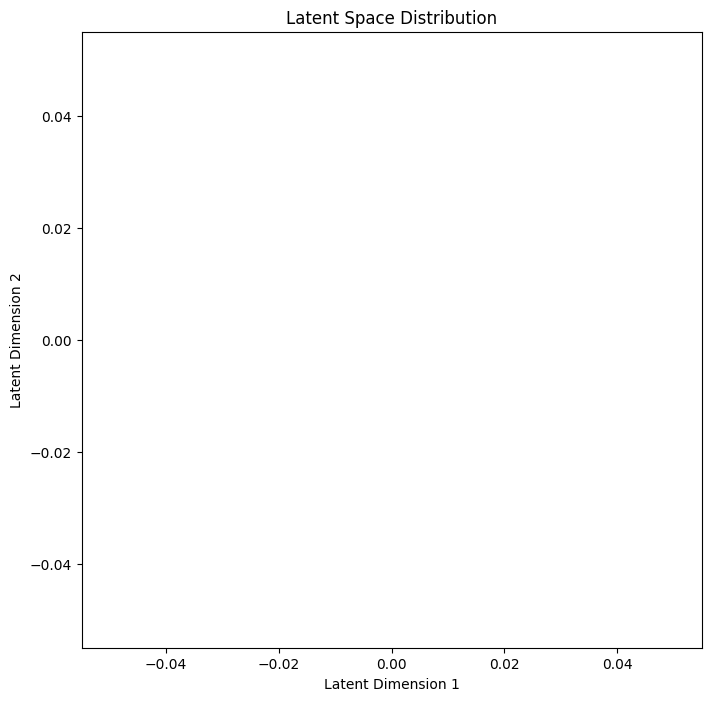

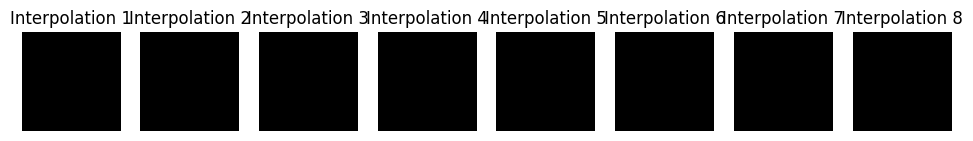

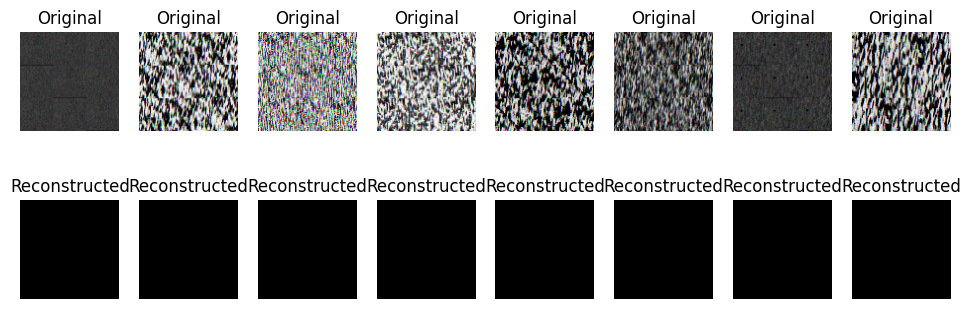

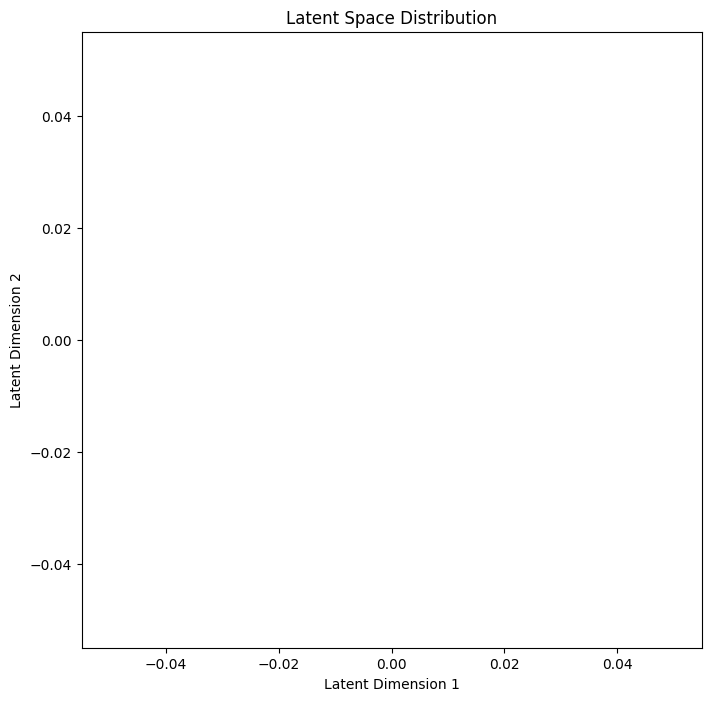

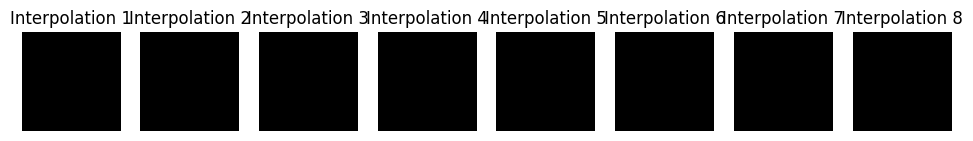

	Epoch 101 complete! 	Average KLD:  tensor(nan, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(nan, grad_fn=<DivBackward0>) 	Average Loss:  nan
	Epoch 102 complete! 	Average KLD:  tensor(nan, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(nan, grad_fn=<DivBackward0>) 	Average Loss:  nan
	Epoch 103 complete! 	Average KLD:  tensor(nan, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(nan, grad_fn=<DivBackward0>) 	Average Loss:  nan
	Epoch 104 complete! 	Average KLD:  tensor(nan, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(nan, grad_fn=<DivBackward0>) 	Average Loss:  nan
	Epoch 105 complete! 	Average KLD:  tensor(nan, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(nan, grad_fn=<DivBackward0>) 	Average Loss:  nan
	Epoch 106 complete! 	Average KLD:  tensor(nan, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(nan, grad_fn=<DivBackward0>) 	Average Loss:  nan
	Epoch 107 complete! 	Average KLD:  tensor(nan, grad_fn=<DivBackward0>) 	Average recon_error: 

In [105]:
print("Start training VAE...")
epochs = 300
loss_values = []
KLD_vals = []
recon_loss_vals = []
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=0.01, steps_per_epoch=len(train_loader), epochs=epochs)
for epoch in range(epochs):
    model.train()
    overall_loss = 0
    KLD = 0
    recon_loss = 0
    for batch_idx, x in enumerate(train_loader):
        x = x.view(batch_size, input_dim).to(DEVICE)
        # x = x.view(x.size(0), -1)
        # x_flat = x.view(-1, 30000)
        # x = x_flat.to(DEVICE)
        x = x.to(DEVICE)

        optimizer.zero_grad()
        # vals = model(x)
        # # print(vals[1])
        x_hat, mean, log_var = model(x)
        # print(f"Thos is XHATTTT: {x_hat.shape}")
        x_hat_flat = x_hat.view(-1, 30000)
        reconstruction_loss = nn.functional.binary_cross_entropy_with_logits(x_hat_flat, x, reduction='sum')
        kl_divergence_loss = -0.5 * torch.sum(1 + log_var - mean.pow(2) - log_var.exp())

        # Combine the two terms
        loss = reconstruction_loss + kl_divergence_loss

        # loss = loss_function(x, x_hat, mean, log_var)

        if epoch == 1 or epoch == 100:
            # Visualize reconstructions
            visualize_reconstructions(x, x_hat)

            # Visualize latent space distribution
            visualize_latent_space_distribution(model, x)

            # Visualize latent space interpolation
            visualize_interpolation(model, x)

        overall_loss += loss.item()
        KLD += kl_divergence_loss
        recon_loss += reconstruction_loss

        loss.backward()
        optimizer.step()
        scheduler.step()

    loss_values.append(loss / len(x))
    KLD_vals.append(kl_divergence_loss/len(x))
    recon_loss_vals.append(reconstruction_loss/len(x))
        # break


    print("\tEpoch", epoch + 1, "complete!", "\tAverage KLD: ", KLD / ((batch_idx + 1)*batch_size),
          "\tAverage recon_error: ", recon_loss / ((batch_idx + 1)*batch_size),
          "\tAverage Loss: ", overall_loss / ((batch_idx + 1)*batch_size))
    # print("\tEpoch", epoch + 1, "complete!", "\tAverage Loss: ", overall_loss / (batch_size))

print("Finish!!")

## Visualize

In [59]:
loss_values = [_.item() for _ in loss_values]
KLD_vals = [_.item() for _ in KLD_vals]
recon_loss_vals = [_.item() for _ in recon_loss_vals]
epoch_x = range(100)
# plt.plot(epoch_x, loss_values, label="total loss")
plt.plot(epoch_x, KLD_vals, label="KL divergence")
# plt.plot(epoch_x, recon_loss_vals, label="reconstruction loss")
plt.legend()
plt.show()

In [31]:
recon_loss_vals[0]

tensor(21957.0508, grad_fn=<DivBackward0>)

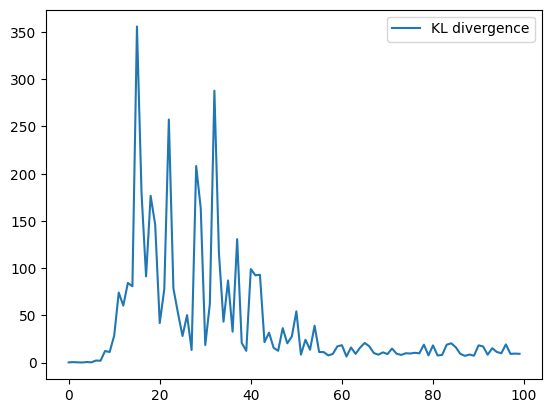

In [63]:

# plt.plot(epoch_x, loss_values, label="total loss")
plt.plot(epoch_x, KLD_vals, label="KL divergence")
# plt.plot(epoch_x, recon_loss_vals, label="reconstruction loss")
plt.legend()
plt.show()

#**change the prior from a standard normal distribution to something**

# Create VAE with prior from exponential distribution


## Define Model

In [64]:
class ExpModel(nn.Module):

    def __init__(self, input_dim):
        super(ExpModel, self).__init__()\
        # encoder
        self.encode_seq = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.LeakyReLU(0.2),
            nn.Linear(hidden_dim, latent_dim * 2), # *2 for mean and log_var
            nn.LeakyReLU(0.2)
            )
        # latent mean
        self.mean = nn.Linear(latent_dim, 2).to(DEVICE)
        # log variance
        self.log_var = nn.Linear(latent_dim, 2).to(DEVICE)

        # decoder
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, latent_dim),
            nn.LeakyReLU(0.2),
            nn.Linear(latent_dim, hidden_dim),
            nn.LeakyReLU(0.2),
            nn.Linear(hidden_dim, input_dim),
            nn.Sigmoid()
            ).to(DEVICE)

    def reparameterization(self, mean, log_var):
        # Change the sampling distribution to exponential
        epsilon = torch.randn_like(mean)
        z = mean - torch.log(epsilon)  # Exponential distribution
        return z

    def forward(self, x):
        encoded = self.encode_seq(x).to(DEVICE)
        mean, log_var = torch.chunk(encoded, 2, dim=-1)
        z = self.reparameterization(mean, log_var)

        # Decoder
        x_hat = self.decoder(z).to(DEVICE)
        return x_hat, mean, log_var

## Train new model

Start training VAE...
	Epoch 1 complete! 	Average KLD:  tensor(nan, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(nan, grad_fn=<DivBackward0>) 	Average Loss:  nan


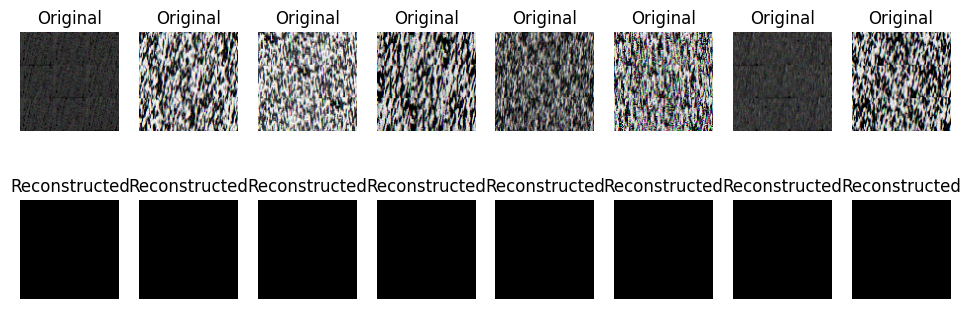

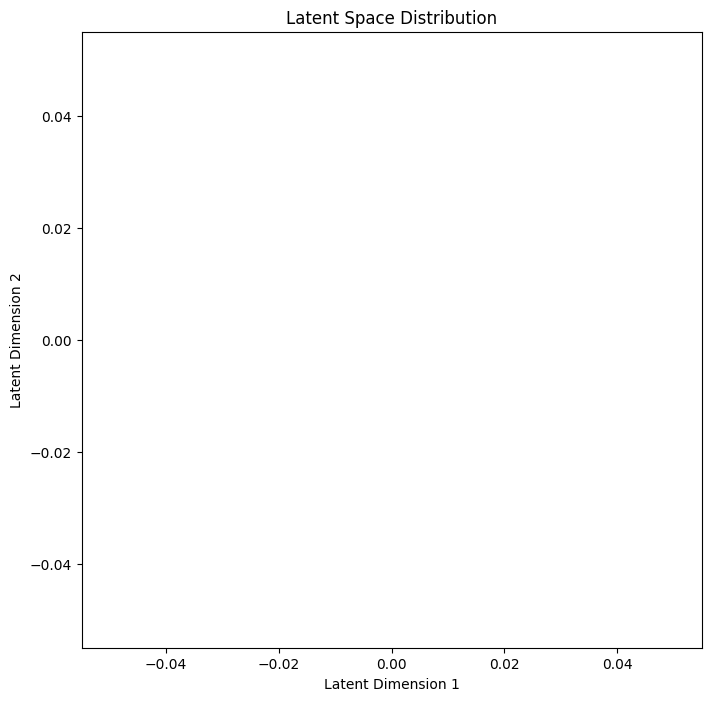

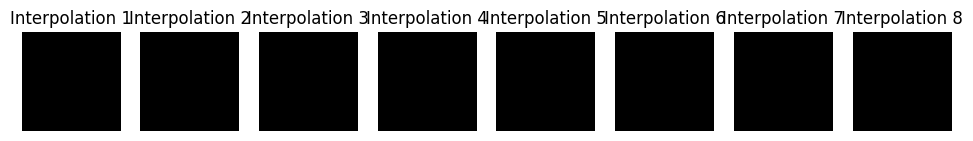

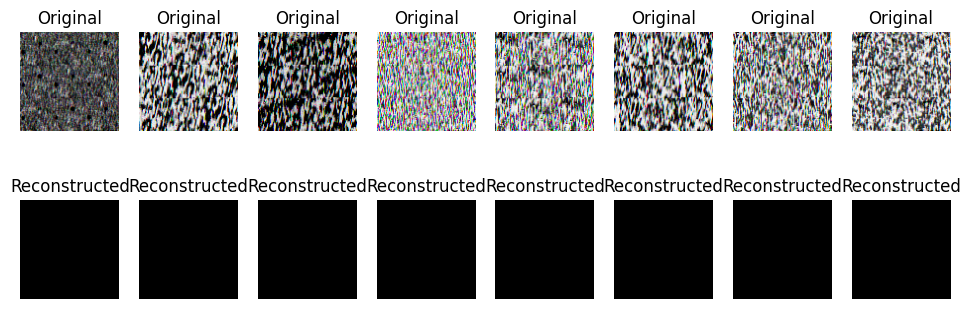

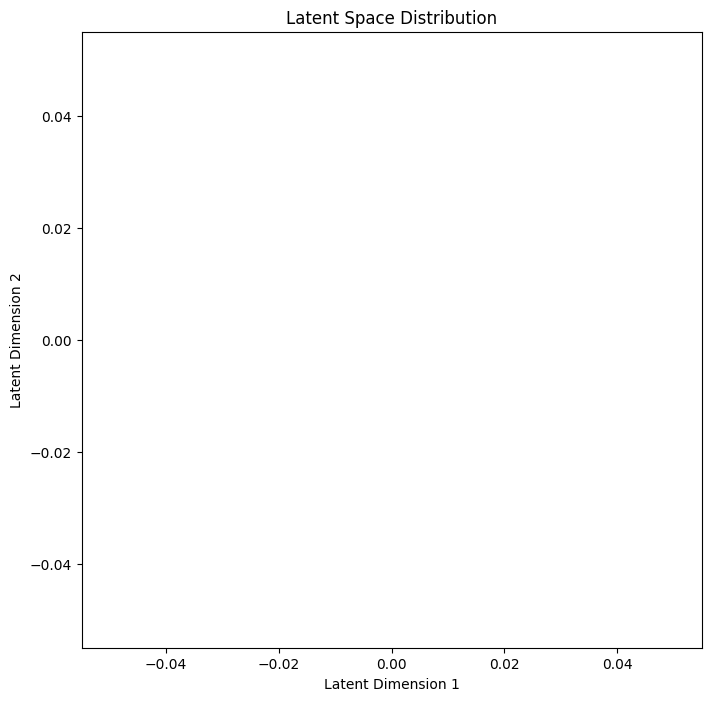

...

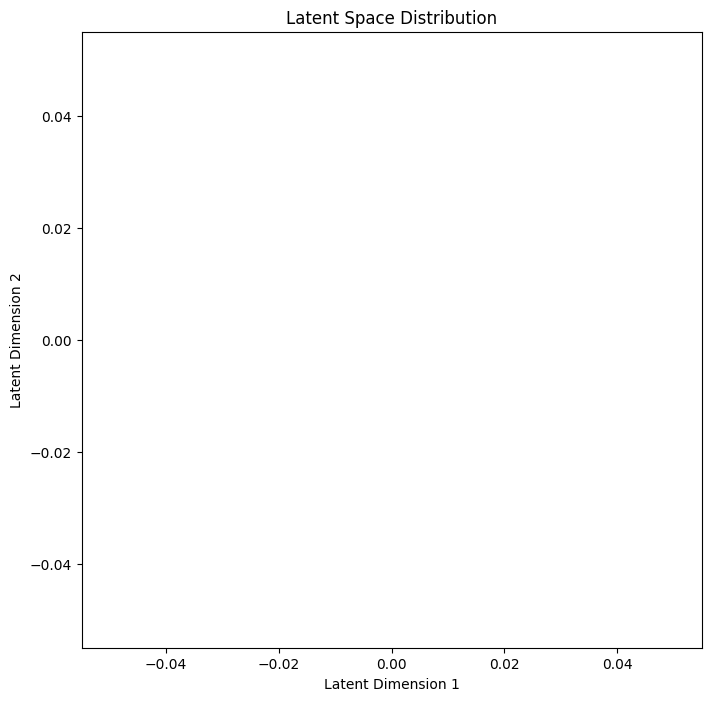

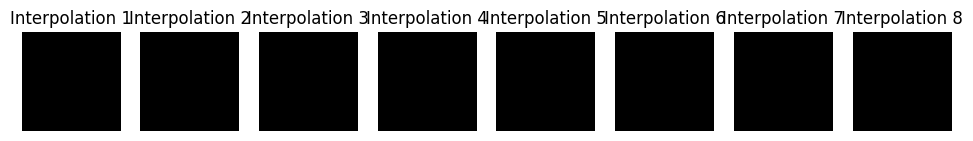

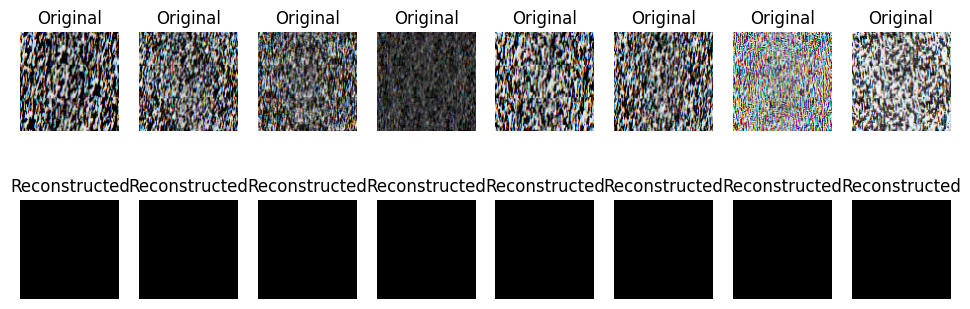

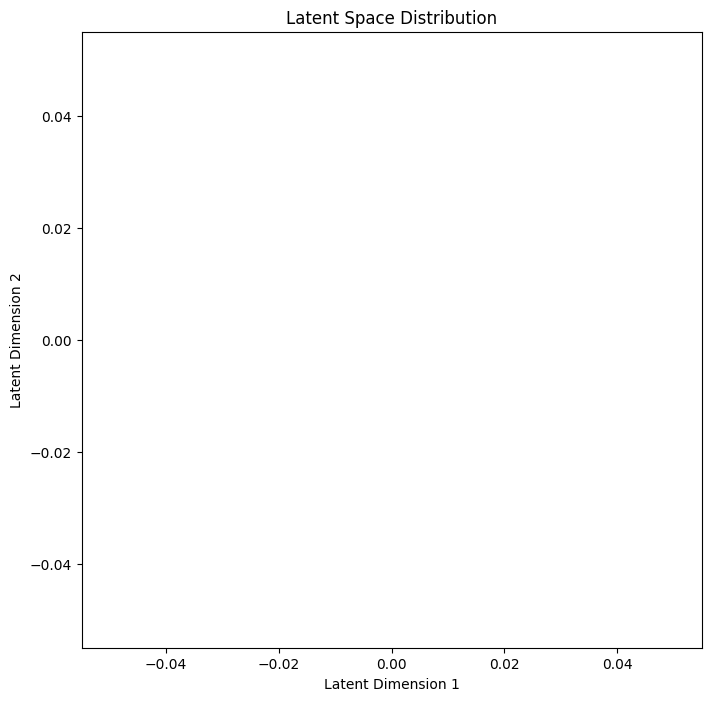

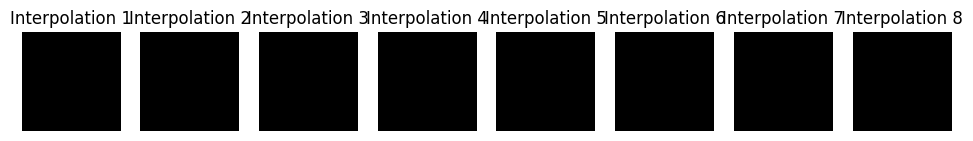

	Epoch 2 complete! 	Average KLD:  tensor(nan, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(nan, grad_fn=<DivBackward0>) 	Average Loss:  nan
	Epoch 3 complete! 	Average KLD:  tensor(nan, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(nan, grad_fn=<DivBackward0>) 	Average Loss:  nan
	Epoch 4 complete! 	Average KLD:  tensor(nan, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(nan, grad_fn=<DivBackward0>) 	Average Loss:  nan
	Epoch 5 complete! 	Average KLD:  tensor(nan, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(nan, grad_fn=<DivBackward0>) 	Average Loss:  nan
	Epoch 6 complete! 	Average KLD:  tensor(nan, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(nan, grad_fn=<DivBackward0>) 	Average Loss:  nan
	Epoch 7 complete! 	Average KLD:  tensor(nan, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(nan, grad_fn=<DivBackward0>) 	Average Loss:  nan
	Epoch 8 complete! 	Average KLD:  tensor(nan, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(nan, g

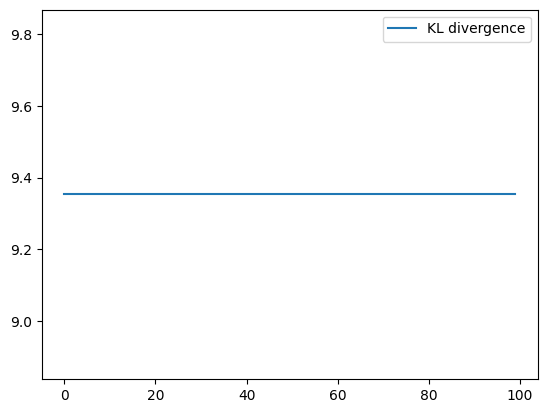

In [65]:
exp_model = ExpModel(input_dim=input_dim).to(DEVICE)
print("Start training VAE...")
exp_model.train()
optimizer = Adam(exp_model.parameters(), lr=lr)
epochs = 100
loss_values = []
KLD_vals = []
recon_loss_vals = []
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=0.01, steps_per_epoch=len(train_loader), epochs=epochs)
for epoch in range(epochs):
    overall_loss = 0
    KLD = 0
    recon_loss = 0
    for batch_idx, x in enumerate(train_loader):
        optimizer.zero_grad()

        x_flat = x.view(-1, input_dim)
        x_hat, mean, log_var = exp_model(x_flat)

        reconstruction_loss = nn.functional.binary_cross_entropy_with_logits(x_hat, x_flat, reduction='sum')
        kl_loss = -0.5 * torch.sum(1 - torch.exp(-2 * log_var) - mean.pow(2) + 2 * log_var)

        loss = reconstruction_loss + kl_loss

        if epoch == 1 or epoch == 100:
            # Visualize reconstructions
            visualize_reconstructions(x, x_hat)

            # Visualize latent space distribution
            visualize_latent_space_distribution(exp_model, x)

            # Visualize latent space interpolation
            visualize_interpolation(exp_model, x)

        overall_loss += loss.item()
        KLD += kl_loss
        recon_loss += reconstruction_loss

        loss.backward()
        optimizer.step()
        scheduler.step()

        # break

    loss_values.append(loss / len(x))
    KLD_vals.append(kl_divergence_loss/len(x))
    recon_loss_vals.append(reconstruction_loss/len(x))

    print("\tEpoch", epoch + 1, "complete!", "\tAverage KLD: ", KLD / ((batch_idx + 1)*batch_size),
          "\tAverage recon_error: ", recon_loss / ((batch_idx + 1)*batch_size),
          "\tAverage Loss: ", overall_loss / ((batch_idx + 1)*batch_size))
    # print("\tEpoch", epoch + 1, "complete!", "\tAverage Loss: ", overall_loss / (batch_size))

print("Finish!!")
loss_values = [_.item() for _ in loss_values]
KLD_vals = [_.item() for _ in KLD_vals]
recon_loss_vals = [_.item() for _ in recon_loss_vals]
epoch_x = range(100)
# plt.plot(epoch_x, loss_values, label="total loss")
plt.plot(epoch_x, KLD_vals, label="KL divergence")
# plt.plot(epoch_x, recon_loss_vals, label="reconstruction loss")
plt.legend()
plt.show()

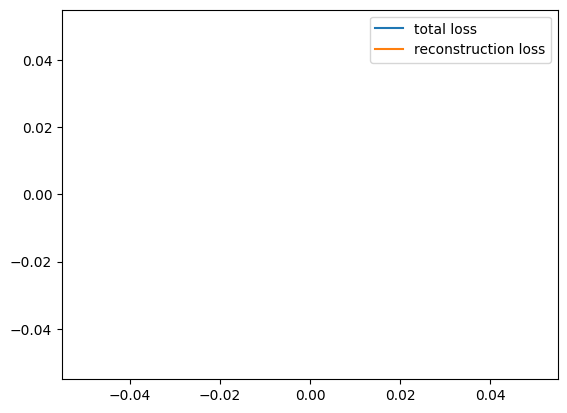

In [67]:
# loss_values = [_.item() for _ in loss_values]
# KLD_vals = [_.item() for _ in KLD_vals]
# recon_loss_vals = [_.item() for _ in recon_loss_vals]
# epoch_x = range(100)
plt.plot(epoch_x, loss_values, label="total loss")
# plt.plot(epoch_x, KLD_vals, label="KL divergence")
plt.plot(epoch_x, recon_loss_vals, label="reconstruction loss")
plt.legend()
plt.show()

# Create model with prior from isotropic lognormal distribution

a prior that is not concentrated at the center of the space but rather on some kind of e.g. hyper-sphere ( isotropic lognormal distribution), but with a representation that is unconstrained

## Define Model

In [68]:
class IsoModel(nn.Module):

    def __init__(self, input_dim):
        super(IsoModel, self).__init__()\
        # encoder
        self.encode_seq = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.LeakyReLU(0.2),
            nn.Linear(hidden_dim, latent_dim * 2), # *2 for mean and log_var
            nn.LeakyReLU(0.2)
            )
        # latent mean
        self.mean = nn.Linear(latent_dim, 2).to(DEVICE)
        # log variance
        self.log_var = nn.Linear(latent_dim, 2).to(DEVICE)

        # decoder
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, latent_dim),
            nn.LeakyReLU(0.2),
            nn.Linear(latent_dim, hidden_dim),
            nn.LeakyReLU(0.2),
            nn.Linear(hidden_dim, input_dim),
            nn.Sigmoid()
            ).to(DEVICE)

    def reparameterization(self, mean, log_var):
        # Change the sampling distribution to isotropic log-normal
        epsilon = torch.randn_like(mean)
        z = mean + epsilon * torch.exp(0.5 * log_var)  # Isotropic log-normal distribution

        # Apply a transformation to make the representation unconstrained
        z_unconstrained = torch.exp(z)
        return z_unconstrained

    def forward(self, x):
        encoded = self.encode_seq(x).to(DEVICE)
        mean, log_var = torch.chunk(encoded, 2, dim=-1)
        z = self.reparameterization(mean, log_var)

        # Decoder
        x_hat = self.decoder(z).to(DEVICE)
        return x_hat, mean, log_var

##Train

Start training VAE...
	Epoch 1 complete! 	Average KLD:  tensor(4.3546, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(23166.2637, grad_fn=<DivBackward0>) 	Average Loss:  23170.61953125


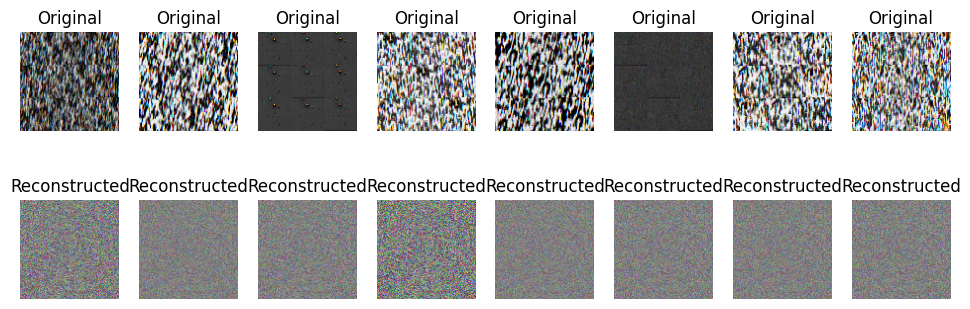

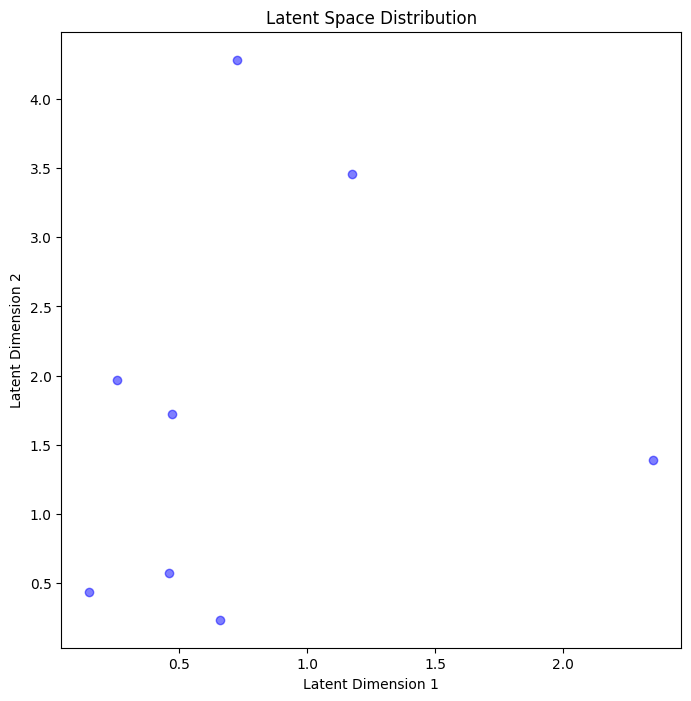

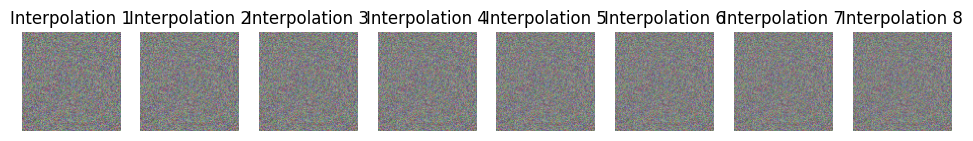

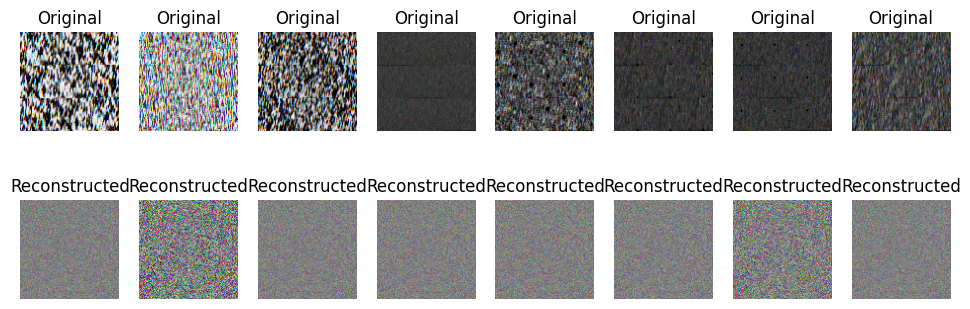

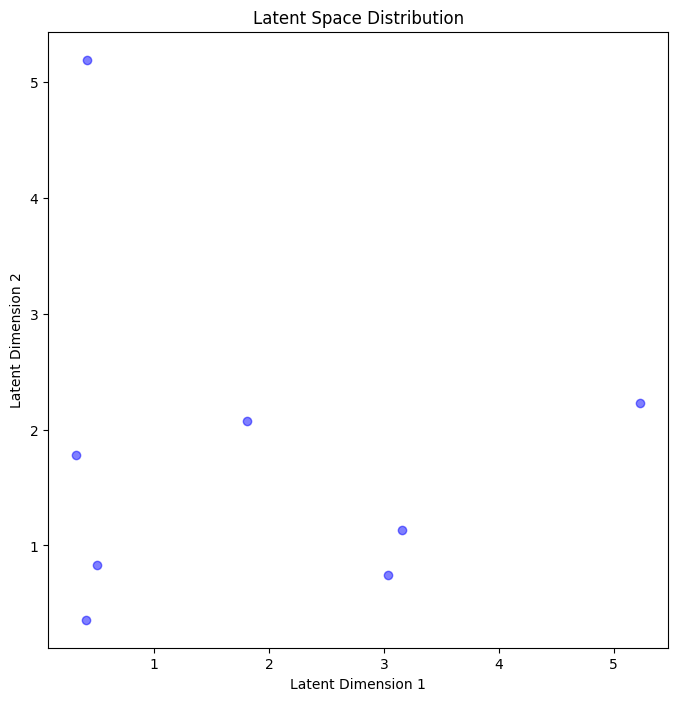

...

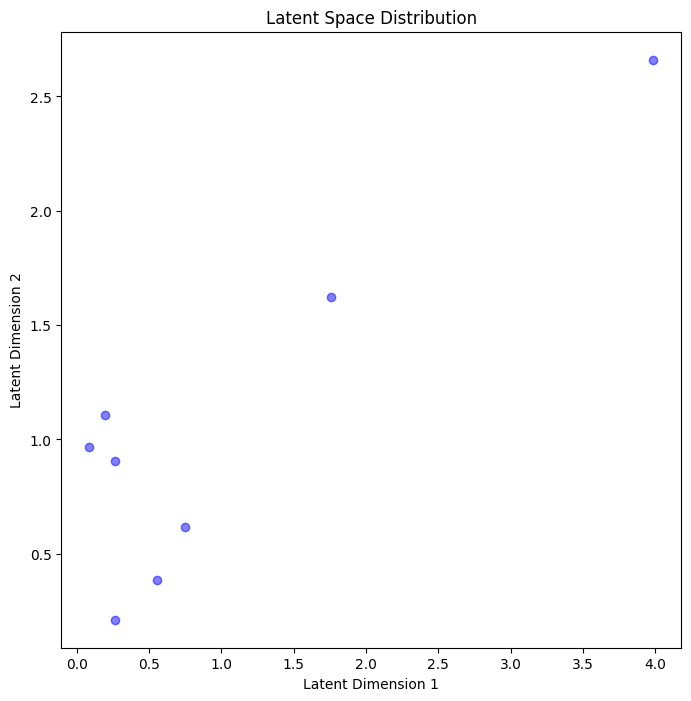

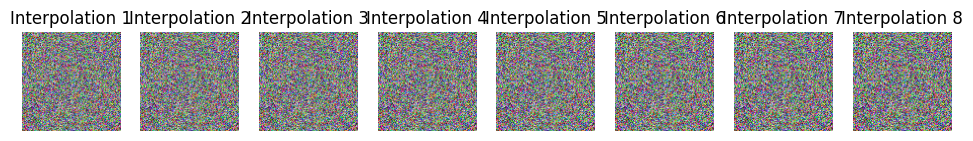

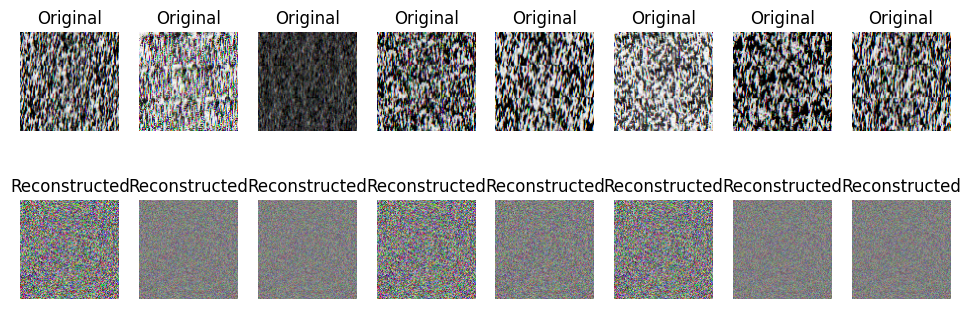

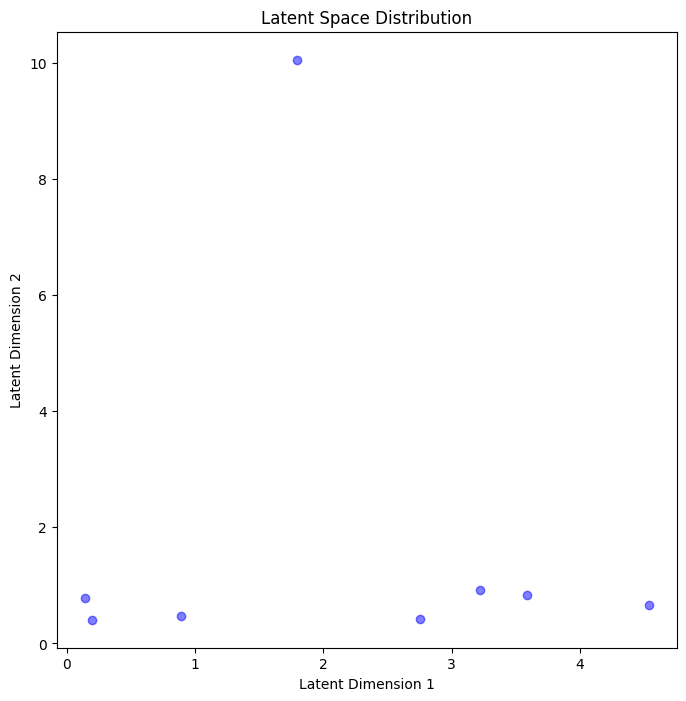

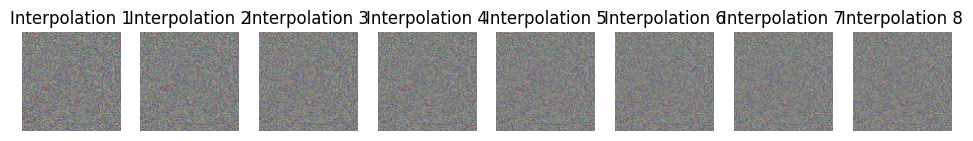

	Epoch 2 complete! 	Average KLD:  tensor(2.9683, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(23076.8340, grad_fn=<DivBackward0>) 	Average Loss:  23079.801953125
	Epoch 3 complete! 	Average KLD:  tensor(6.1029, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(23100.1055, grad_fn=<DivBackward0>) 	Average Loss:  23106.20859375
	Epoch 4 complete! 	Average KLD:  tensor(6.7739, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(23104.6348, grad_fn=<DivBackward0>) 	Average Loss:  23111.408984375
	Epoch 5 complete! 	Average KLD:  tensor(3.5655, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(23028.4961, grad_fn=<DivBackward0>) 	Average Loss:  23032.061328125
	Epoch 6 complete! 	Average KLD:  tensor(18.2226, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(23168.2363, grad_fn=<DivBackward0>) 	Average Loss:  23186.4578125
	Epoch 7 complete! 	Average KLD:  tensor(4.8213, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(23039.9316, grad_fn=<DivBackward0>) 	Average

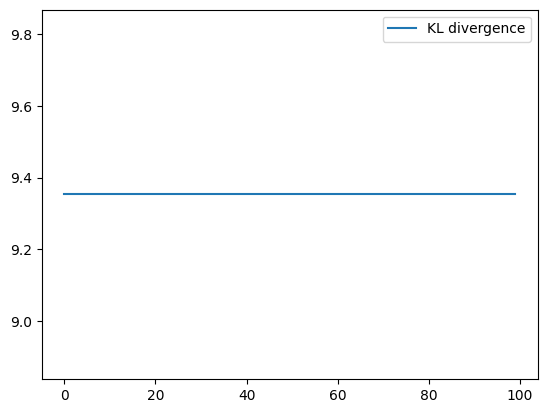

In [69]:
iso_model = IsoModel(input_dim=input_dim).to(DEVICE)
print("Start training VAE...")
iso_model.train()
optimizer = Adam(iso_model.parameters(), lr=lr)
epochs = 100
loss_values = []
KLD_vals = []
recon_loss_vals = []
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=0.01, steps_per_epoch=len(train_loader), epochs=epochs)
for epoch in range(epochs):
    overall_loss = 0
    KLD = 0
    recon_loss = 0
    for batch_idx, x in enumerate(train_loader):
        optimizer.zero_grad()

        x_flat = x.view(-1, input_dim)
        x_hat, mean, log_var = iso_model(x_flat)

        reconstruction_loss = nn.functional.binary_cross_entropy_with_logits(x_hat, x_flat, reduction='sum')
        # Change the KL divergence for isotropic log-normal prior unconstrained
        kl_loss = -0.5 * torch.sum(1 + log_var - mean.pow(2) - log_var.exp())

        loss = reconstruction_loss + kl_loss
        if epoch == 1 or epoch == 100:
            # Visualize reconstructions
            visualize_reconstructions(x, x_hat)

            # Visualize latent space distribution
            visualize_latent_space_distribution(iso_model, x)

            # Visualize latent space interpolation
            visualize_interpolation(iso_model, x)

        overall_loss += loss.item()
        KLD += kl_loss
        recon_loss += reconstruction_loss

        loss.backward()
        optimizer.step()
        scheduler.step()

        # break

    loss_values.append(loss / len(x))
    KLD_vals.append(kl_divergence_loss/len(x))
    recon_loss_vals.append(reconstruction_loss/len(x))

    print("\tEpoch", epoch + 1, "complete!", "\tAverage KLD: ", KLD / ((batch_idx + 1)*batch_size),
          "\tAverage recon_error: ", recon_loss / ((batch_idx + 1)*batch_size),
          "\tAverage Loss: ", overall_loss / ((batch_idx + 1)*batch_size))
    # print("\tEpoch", epoch + 1, "complete!", "\tAverage Loss: ", overall_loss / (batch_size))

print("Finish!!")
loss_values = [_.item() for _ in loss_values]
KLD_vals = [_.item() for _ in KLD_vals]
recon_loss_vals = [_.item() for _ in recon_loss_vals]
epoch_x = range(100)
# plt.plot(epoch_x, loss_values, label="total loss")
plt.plot(epoch_x, KLD_vals, label="KL divergence")
# plt.plot(epoch_x, recon_loss_vals, label="reconstruction loss")
plt.legend()
plt.show()

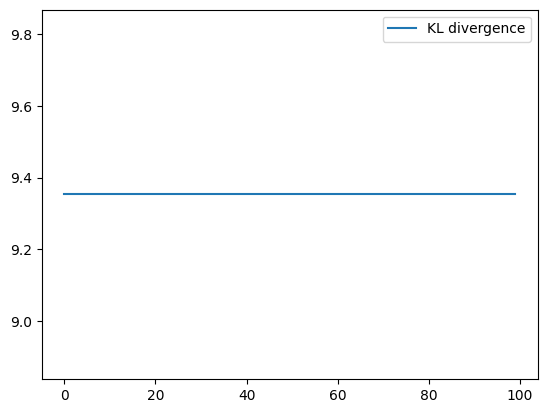

In [71]:
epoch_x = range(100)
# plt.plot(epoch_x, loss_values, label="total loss")
plt.plot(epoch_x, KLD_vals, label="KL divergence")
# plt.plot(epoch_x, recon_loss_vals, label="reconstruction loss")
plt.legend()
plt.show()

# Create VAE with prior/latent forced to be on a sphere

## Define Model

In [77]:
class NormModel(nn.Module):

    def __init__(self, input_dim):
        super(NormModel, self).__init__()\
        # encoder
        self.encode_seq = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.LeakyReLU(0.2),
            nn.Linear(hidden_dim, latent_dim * 2), # *2 for mean and log_var
            nn.LeakyReLU(0.2)
            )
        # latent mean
        self.mean = nn.Linear(latent_dim, 2).to(DEVICE)
        # log variance
        self.log_var = nn.Linear(latent_dim, 2).to(DEVICE)

        # decoder
        self.decoder = nn.Sequential(
            nn.Linear(5, latent_dim),
            nn.LeakyReLU(0.2),
            nn.Linear(latent_dim, hidden_dim),
            nn.LeakyReLU(0.2),
            nn.Linear(hidden_dim, input_dim),
            nn.Sigmoid()
            ).to(DEVICE)

    def reparameterization(self, mean, log_var):
        # Change the sampling distribution to isotropic log-normal
        epsilon = torch.randn_like(mean)
        z = mean + epsilon * torch.exp(0.5 * log_var)

        # Normalize the latent vectors to lie on a sphere
        z_normalized = nn.functional.normalize(z, p=2, dim=-1) #The p=2 argument specifies L2 normalization
        return z_normalized

    def forward(self, x):
        encoded = self.encode_seq(x).to(DEVICE)
        mean, log_var = torch.chunk(encoded, 2, dim=-1)
        z = self.reparameterization(mean, log_var)

        # Decoder
        x_hat = self.decoder(z).to(DEVICE)
        return x_hat, mean, log_var

##Train

Start training VAE...
	Epoch 1 complete! 	Average KLD:  tensor(2.4008, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(23045.2012, grad_fn=<DivBackward0>) 	Average Loss:  nan


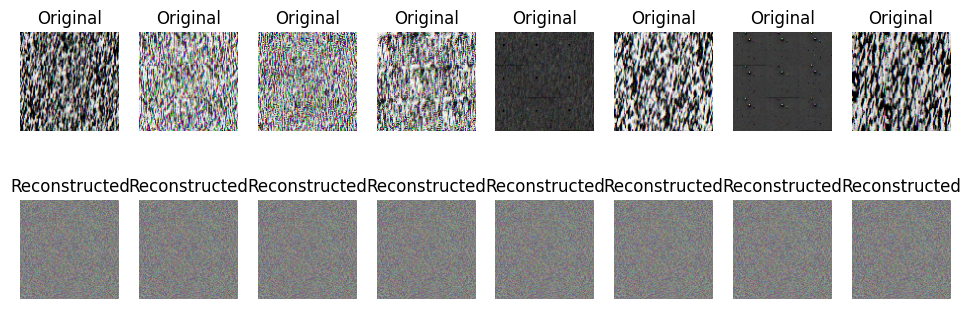

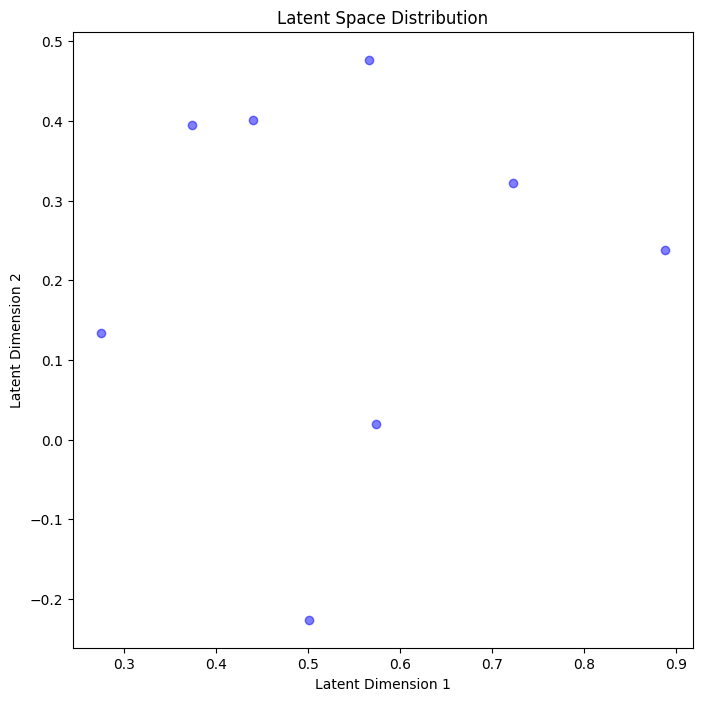

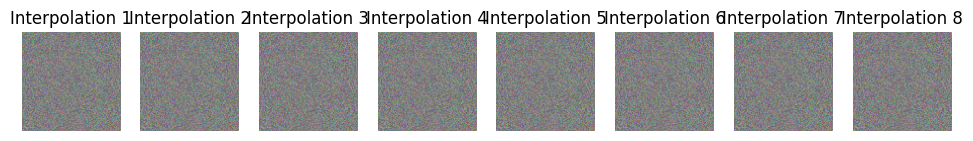

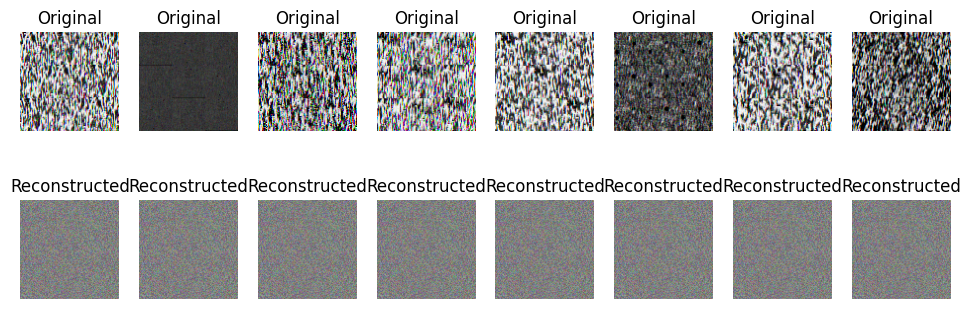

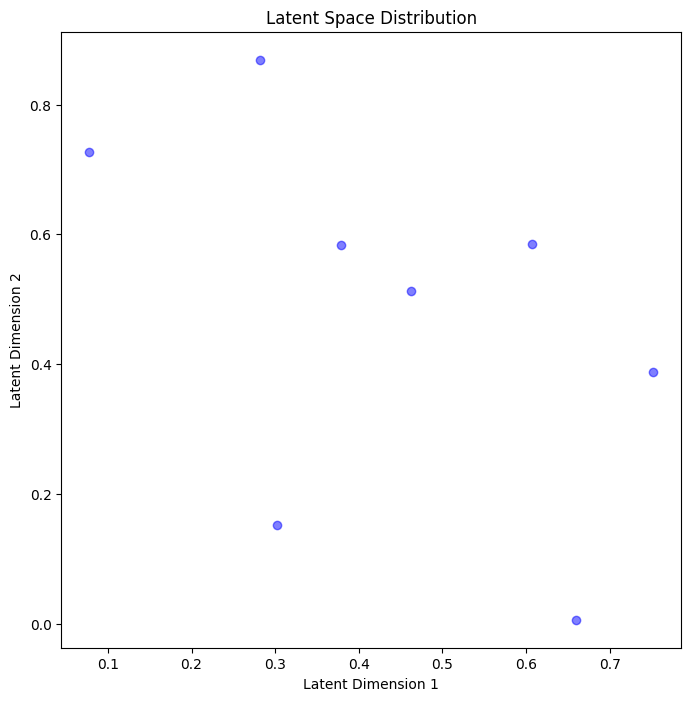

...

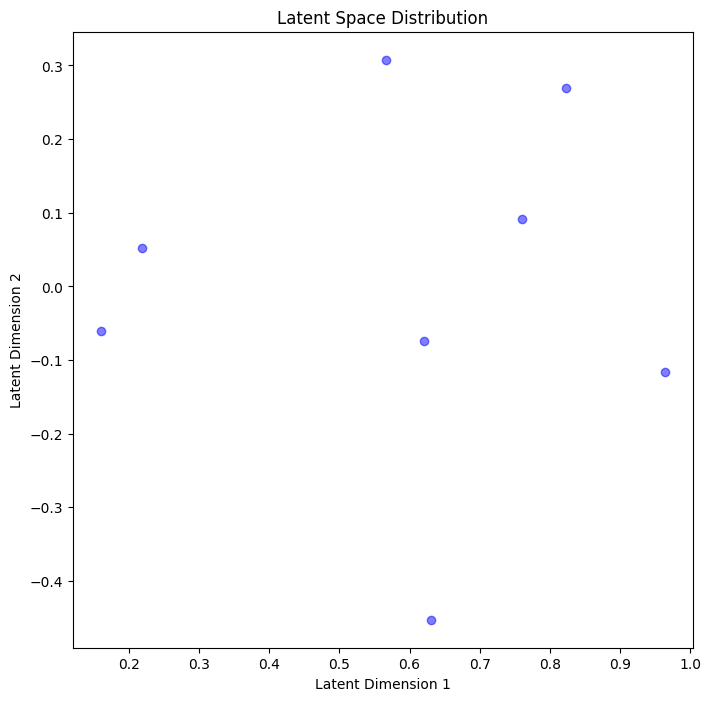

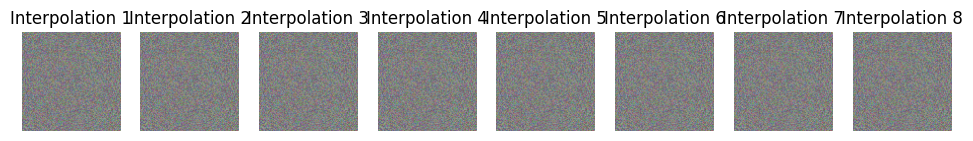

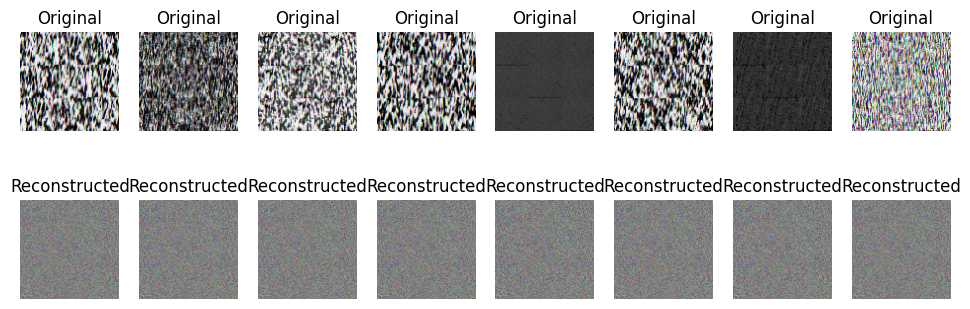

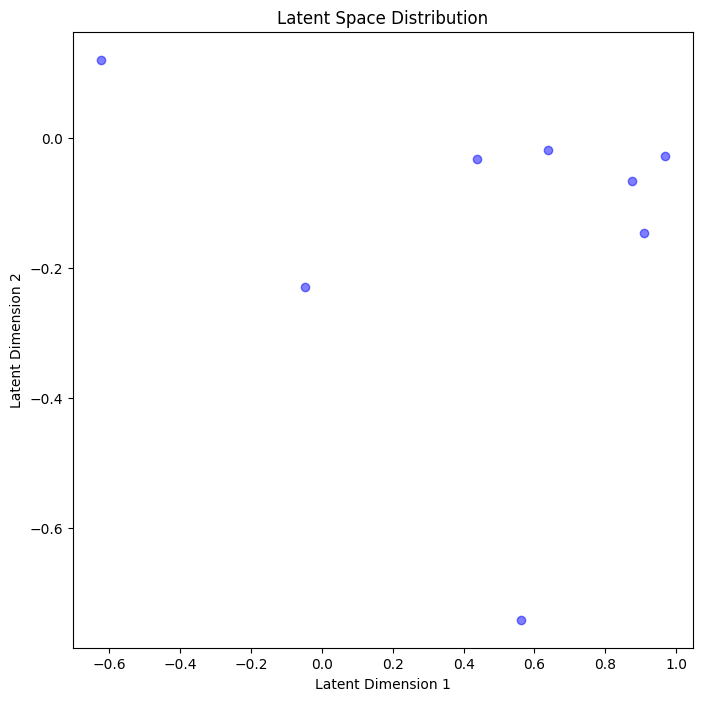

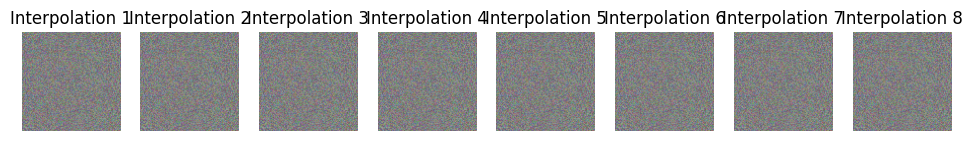

	Epoch 2 complete! 	Average KLD:  tensor(1.7643, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(23040.8242, grad_fn=<DivBackward0>) 	Average Loss:  nan
	Epoch 3 complete! 	Average KLD:  tensor(1.4051, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(23036.5762, grad_fn=<DivBackward0>) 	Average Loss:  nan
	Epoch 4 complete! 	Average KLD:  tensor(1.6717, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(23030.7246, grad_fn=<DivBackward0>) 	Average Loss:  nan
	Epoch 5 complete! 	Average KLD:  tensor(1.7920, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(23023.9629, grad_fn=<DivBackward0>) 	Average Loss:  nan
	Epoch 6 complete! 	Average KLD:  tensor(1.0016, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(23014.2109, grad_fn=<DivBackward0>) 	Average Loss:  nan
	Epoch 7 complete! 	Average KLD:  tensor(0.7313, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(23002.9414, grad_fn=<DivBackward0>) 	Average Loss:  nan
	Epoch 8 complete! 	Average KLD:  tensor(0.855

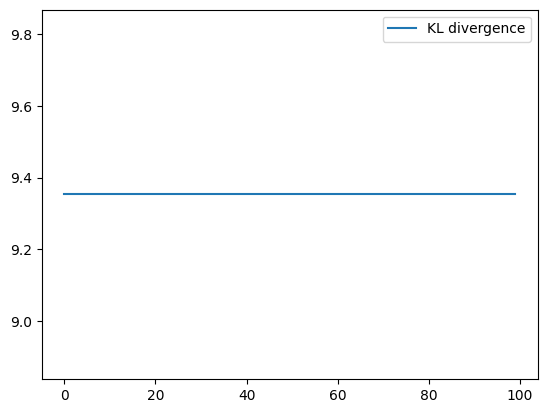

In [78]:
norm_model = NormModel(input_dim=input_dim).to(DEVICE)
print("Start training VAE...")
norm_model.train()
epochs = 100
loss_values = []
KLD_vals = []
recon_loss_vals = []
optimizer = Adam(norm_model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=0.01, steps_per_epoch=len(train_loader), epochs=epochs)
for epoch in range(epochs):
    overall_loss = 0
    KLD = 0
    recon_loss = 0
    for batch_idx, x in enumerate(train_loader):
        optimizer.zero_grad()

        x_flat = x.view(-1, input_dim)
        x_hat, mean, log_var = norm_model(x_flat)

        reconstruction_loss = nn.functional.binary_cross_entropy_with_logits(x_hat, x_flat, reduction='sum')
        # Change the KL divergence for a prior with a normal distribution on a sphere
        kl_loss = -0.5 * torch.sum(1 + log_var - mean.pow(2) - log_var.exp())

        total_loss = reconstruction_loss + kl_loss
        if epoch == 1 or epoch == 100:
            # Visualize reconstructions
            visualize_reconstructions(x, x_hat)

            # Visualize latent space distribution
            visualize_latent_space_distribution(norm_model, x)

            # Visualize latent space interpolation
            visualize_interpolation(norm_model, x)
        overall_loss += loss.item()
        KLD += kl_loss
        recon_loss += reconstruction_loss

        total_loss.backward()
        optimizer.step()
        scheduler.step()

        # break

    loss_values.append(loss / len(x))
    KLD_vals.append(kl_divergence_loss/len(x))
    recon_loss_vals.append(reconstruction_loss/len(x))

    print("\tEpoch", epoch + 1, "complete!", "\tAverage KLD: ", KLD / ((batch_idx + 1)*batch_size),
          "\tAverage recon_error: ", recon_loss / ((batch_idx + 1)*batch_size),
          "\tAverage Loss: ", overall_loss / ((batch_idx + 1)*batch_size))
    # print("\tEpoch", epoch + 1, "complete!", "\tAverage Loss: ", overall_loss / (batch_size))

print("Finish!!")
loss_values = [_.item() for _ in loss_values]
KLD_vals = [_.item() for _ in KLD_vals]
recon_loss_vals = [_.item() for _ in recon_loss_vals]
epoch_x = range(100)
# plt.plot(epoch_x, loss_values, label="total loss")
plt.plot(epoch_x, KLD_vals, label="KL divergence")
# plt.plot(epoch_x, recon_loss_vals, label="reconstruction loss")
plt.legend()
plt.show()

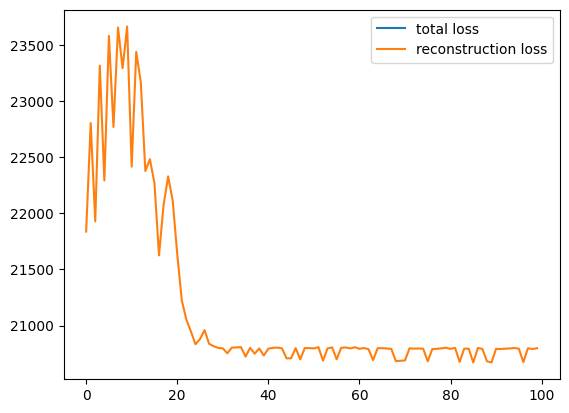

In [80]:
# loss_values = [_.item() for _ in loss_values]
# KLD_vals = [_.item() for _ in KLD_vals]
# recon_loss_vals = [_.item() for _ in recon_loss_vals]
epoch_x = range(100)
plt.plot(epoch_x, loss_values, label="total loss")
# plt.plot(epoch_x, KLD_vals, label="KL divergence")
plt.plot(epoch_x, recon_loss_vals, label="reconstruction loss")
plt.legend()
plt.show()

# Create VAE witha Dirichlet prior and a latent representation forced to be on a simplex

## Define Model

In [84]:
class DirichletModel(nn.Module):
    def __init__(self, input_dim):
        super(DirichletModel, self).__init__()\
        # encoder
        self.encode_seq = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.LeakyReLU(0.2),
            nn.Linear(hidden_dim, latent_dim), # No *2 here, as we have one parameter per dimension in Dirichlet
            nn.LeakyReLU(0.2)
            )
        # latent mean
        self.mean = nn.Linear(latent_dim, 2).to(DEVICE)
        # log variance
        self.log_var = nn.Linear(latent_dim, 2).to(DEVICE)

        # decoder
        self.decoder = nn.Sequential(
            nn.Linear(5, latent_dim),
            nn.LeakyReLU(0.2),
            nn.Linear(latent_dim, hidden_dim),
            nn.LeakyReLU(0.2),
            nn.Linear(hidden_dim, input_dim),
            nn.Sigmoid()
            ).to(DEVICE)

    def reparameterization(self, param):
        # Reparameterization trick with Dirichlet distribution
        epsilon = torch.randn_like(param)
        z = nn.functional.softmax(param + epsilon, dim=-1)  # Ensure that the samples sum to 1

        # Apply a transformation to make the representation unconstrained
        z_unconstrained = torch.exp(z)
        return z

    def forward(self, x):
        encoded = self.encode_seq(x).to(DEVICE)
        param = encoded # Dirichlet parameters
        z = self.reparameterization(param)

        # Decoder
        x_hat = self.decoder(z).to(DEVICE)
        return x_hat, param

## Train

Start training VAE...
	Epoch 1 complete! 	Average KLD:  tensor(14.7896, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(23047.7773, grad_fn=<DivBackward0>) 	Average Loss:  nan


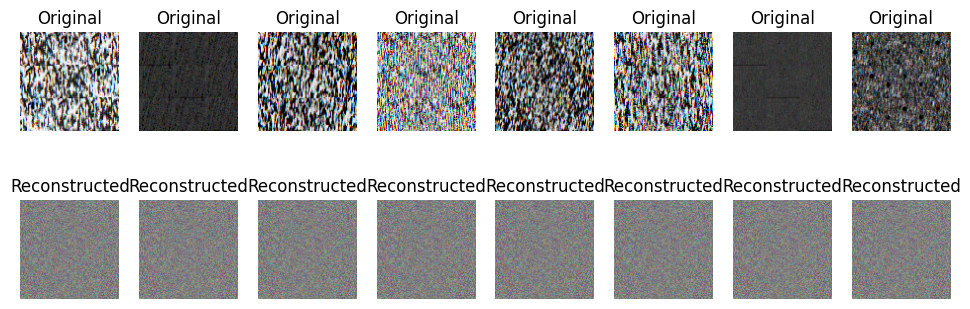

ValueError: not enough values to unpack (expected 3, got 2)

In [85]:
d_model = DirichletModel(input_dim=input_dim).to(DEVICE)
print("Start training VAE...")
d_model.train()
optimizer = Adam(d_model.parameters(), lr=lr)
epochs = 100
loss_values = []
KLD_vals = []
recon_loss_vals = []
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=0.01, steps_per_epoch=len(train_loader), epochs=epochs)
for epoch in range(epochs):
    overall_loss = 0
    KLD = 0
    recon_loss = 0
    for batch_idx, x in enumerate(train_loader):
        optimizer.zero_grad()

        x_flat = x.view(-1, input_dim)
        x_hat, param = d_model(x_flat)

        reconstruction_loss = nn.functional.binary_cross_entropy_with_logits(x_hat, x_flat, reduction='sum')
        # Change the KL divergence for a Dirichlet prior on a simplex
        alpha = torch.ones_like(param)  # Concentration parameters for the Dirichlet
        kl_loss = torch.sum((alpha - 1) * (torch.log(alpha) - param) + torch.lgamma(param) - torch.lgamma(alpha))

        total_loss = reconstruction_loss + kl_loss

        if epoch == 1 or epoch == 100:
            # Visualize reconstructions
            visualize_reconstructions(x, x_hat)

            # Visualize latent space distribution
            visualize_latent_space_distribution(d_model, x)

            # Visualize latent space interpolation
            visualize_interpolation(d_model, x)
        overall_loss += loss.item()
        KLD += kl_loss
        recon_loss += reconstruction_loss

        total_loss.backward()
        optimizer.step()
        scheduler.step()

        # break

    loss_values.append(loss / len(x))
    KLD_vals.append(kl_divergence_loss/len(x))
    recon_loss_vals.append(reconstruction_loss/len(x))

    print("\tEpoch", epoch + 1, "complete!", "\tAverage KLD: ", KLD / ((batch_idx + 1)*batch_size),
          "\tAverage recon_error: ", recon_loss / ((batch_idx + 1)*batch_size),
          "\tAverage Loss: ", overall_loss / ((batch_idx + 1)*batch_size))
    # print("\tEpoch", epoch + 1, "complete!", "\tAverage Loss: ", overall_loss / (batch_size))

print("Finish!!")
loss_values = [_.item() for _ in loss_values]
KLD_vals = [_.item() for _ in KLD_vals]
recon_loss_vals = [_.item() for _ in recon_loss_vals]
epoch_x = range(100)
# plt.plot(epoch_x, loss_values, label="total loss")
plt.plot(epoch_x, KLD_vals, label="KL divergence")
# plt.plot(epoch_x, recon_loss_vals, label="reconstruction loss")
plt.legend()
plt.show()

# Creat VAE with GMM
For a Gaussian Mixture Model (GMM) with a combination of fixed or trained parameters in the latent space of a VAE, we can modify the VAE to include a GMM component.

## Define Model

In [98]:
class ModelWithGMM(nn.Module):
    def __init__(self, input_dim, num_components):
        super(ModelWithGMM, self).__init__()
        self.num_components = num_components
        # encoder
        self.encode_seq = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.LeakyReLU(0.2),
            nn.Linear(hidden_dim, latent_dim * (2 + num_components)), # * (2 + num_components) for mean, log_var, and GMM parameters
            nn.LeakyReLU(0.2)
            )
        # latent mean
        self.mean = nn.Linear(latent_dim, 2).to(DEVICE)
        # log variance
        self.log_var = nn.Linear(latent_dim, 2).to(DEVICE)

        # decoder
        self.decoder = nn.Sequential(
            nn.Linear(12, latent_dim),
            nn.LeakyReLU(0.2),
            nn.Linear(latent_dim, hidden_dim),
            nn.LeakyReLU(0.2),
            nn.Linear(hidden_dim, input_dim),
            nn.Sigmoid()
            ).to(DEVICE)

    def reparameterization(self, mean, log_var, gmm_params):
        # Reparameterization trick with normal distribution
        epsilon = torch.randn_like(mean)
        z = mean + epsilon * torch.exp(0.5 * log_var)

        # GMM parameters
        gmm_weights = nn.functional.softmax(gmm_params[:, :self.num_components], dim=-1)
        gmm_means = gmm_params[:, self.num_components:2*self.num_components]
        gmm_log_vars = gmm_params[:, 2*self.num_components:]

        return z, gmm_weights, gmm_means, gmm_log_vars

    def forward(self, x):
        encoded = self.encode_seq(x).to(DEVICE)
        mean, log_var, gmm_params = torch.chunk(encoded, 3, dim=-1)
        z, gmm_weights, gmm_means, gmm_log_vars = self.reparameterization(mean, log_var, gmm_params)

        # Decoder
        x_hat = self.decoder(z).to(DEVICE)
        return x_hat, mean, log_var, gmm_params, gmm_weights, gmm_means, gmm_log_vars

## Train

In [99]:
# Function to visualize latent space interpolation
def gmm_visualize_interpolation(model, x, num_samples=8):
    model.eval()
    with torch.no_grad():
        # data_iter = iter(data_loader)
        # x = next(data_iter)
        x_flat = x.view(-1, input_dim)
        x_hat, mean, log_var, gmm_params, gmm_weights, gmm_means, gmm_log_vars =  model(x_flat)
        z = model.reparameterization(mean, log_var)

        plt.figure(figsize=(12, 4))
        for i in range(num_samples):
            alpha = i / (num_samples - 1)
            z_interp = alpha * z[0] + (1 - alpha) * z[1]
            x_interp = model.decoder(z_interp)
            x_interp = x_interp.reshape(100, 100, 3).detach().numpy()

            plt.subplot(1, num_samples, i + 1)
            plt.imshow(x_interp)
            plt.axis('off')
            plt.title(f'Interpolation {i+1}')
        plt.show()

# Function to visualize latent space distribution
def gmm_visualize_latent_space_distribution(model, x):
    model.eval()
    with torch.no_grad():
        # data_iter = iter(data_loader)
        # x = next(data_iter)
        x_flat = x.view(-1, input_dim)
        x_hat, mean, log_var, gmm_params, gmm_weights, gmm_means, gmm_log_vars =  model(x_flat)
        z = model.reparameterization(mean, log_var, gmm_params)

        plt.figure(figsize=(8, 8))
        plt.scatter(z[:, 0], z[:, 1], c='b', marker='o', alpha=0.5)
        plt.title('Latent Space Distribution')
        plt.xlabel('Latent Dimension 1')
        plt.ylabel('Latent Dimension 2')
        plt.show()



Start training VAE...
	Epoch 1 complete! 	Average KLD:  tensor(10.6741, grad_fn=<DivBackward0>) 	Average recon_error:  tensor(23051.1816, grad_fn=<DivBackward0>) 	Average Loss:  nan


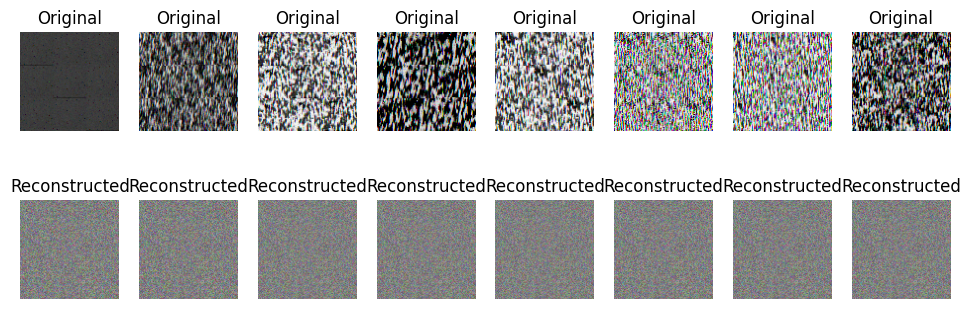

TypeError: tuple indices must be integers or slices, not tuple

<Figure size 800x800 with 0 Axes>

In [100]:
num_components = 5  # Number of components in the GMM
gmm_model = ModelWithGMM(input_dim=input_dim, num_components=num_components).to(DEVICE)
print("Start training VAE...")
gmm_model.train()
optimizer = Adam(gmm_model.parameters(), lr=lr)
epochs = 100
loss_values = []
KLD_vals = []
recon_loss_vals = []
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=0.01, steps_per_epoch=len(train_loader), epochs=epochs)
for epoch in range(epochs):
    overall_loss = 0
    KLD = 0
    recon_loss = 0
    for batch_idx, x in enumerate(train_loader):
        optimizer.zero_grad()

        x_flat = x.view(-1, input_dim)
        x_hat, mean, log_var, gmm_params, gmm_weights, gmm_means, gmm_log_vars = gmm_model(x_flat)

        reconstruction_loss = nn.functional.binary_cross_entropy_with_logits(x_hat, x_flat, reduction='sum')

        # Change the KL divergence for a GMM prior
        # (Assuming a diagonal covariance matrix for simplicity)
        k = gmm_weights.size(-1)
        gmm_kl_divergence = -0.5 * torch.sum(1 + gmm_log_vars - gmm_means.pow(2) - gmm_log_vars.exp())
        gmm_kl_divergence += torch.sum(gmm_weights * torch.log(gmm_weights.new_tensor([k/2])))

        # Change the KL divergence for a standard normal prior
        kl_divergence = -0.5 * torch.sum(1 + log_var - mean.pow(2) - log_var.exp())

        kl_loss = kl_divergence + gmm_kl_divergence

        total_loss = reconstruction_loss + kl_loss
        if epoch == 1 or epoch == 100:
            # Visualize reconstructions
            visualize_reconstructions(x, x_hat)

            # Visualize latent space distribution
            gmm_visualize_latent_space_distribution(gmm_model, x)

            # Visualize latent space interpolation
            gmm_visualize_interpolation(gmm_model, x)

        overall_loss += loss.item()
        KLD += kl_loss
        recon_loss += reconstruction_loss

        total_loss.backward()
        optimizer.step()
        scheduler.step()

        # break

    loss_values.append(loss / len(x))
    KLD_vals.append(kl_divergence_loss/len(x))
    recon_loss_vals.append(reconstruction_loss/len(x))

    print("\tEpoch", epoch + 1, "complete!", "\tAverage KLD: ", KLD / ((batch_idx + 1)*batch_size),
          "\tAverage recon_error: ", recon_loss / ((batch_idx + 1)*batch_size),
          "\tAverage Loss: ", overall_loss / ((batch_idx + 1)*batch_size))
    # print("\tEpoch", epoch + 1, "complete!", "\tAverage Loss: ", overall_loss / (batch_size))

print("Finish!!")
loss_values = [_.item() for _ in loss_values]
KLD_vals = [_.item() for _ in KLD_vals]
recon_loss_vals = [_.item() for _ in recon_loss_vals]
epoch_x = range(100)
# plt.plot(epoch_x, loss_values, label="total loss")
plt.plot(epoch_x, KLD_vals, label="KL divergence")
# plt.plot(epoch_x, recon_loss_vals, label="reconstruction loss")
plt.legend()
plt.show()

The idea is to start with a Variational AutoEncoder (VAE) and experiment with some modifications. Any improvement might be of interest, some might be already existing in the literature (provide references in such cases), but ideally something original should be proposed. Here are a few possible directions/inspirations:

### change the prior from a standard normal distribution to something else, e.g.
** simply, an exponential distribution (or any variation of a normal where the square is changed into another power),
** a prior that is not concentrated at the center of the space but rather on some kind of e.g. hyper-sphere (e.g. consider a isotropic lognormal distribution), but with a representation that is unconstrained
** a normal (or other) but with a latent representation that is forced to be on a sphere
** a Dirichlet prior, with a latent representation forced to be on a simplex
** a mixture distribution, e.g. a GMM, with an combination of fixed or trained parameters,
** a distribution modeled using e.g. a denoising diffusion process, INN, …
…
### adding (more) uncertainty quantification in the network, which can be imagined in several ways including
* working with bayesian neural nets, for instance, Monte-Carlo dropout
* having the decoder quantify its uncertainty (predict a complete gaussian with a mean and a variance, not just a mean)
* having the decoder quantify its uncertainty but also quantify a form of correlation between dimensions (not some independent gaussians)
* having the decoder predict a GMM (for each dimension or across dimensions)
* thinking about the same but in the latent space prediction (output of the encoder)
…
###change the stochasticity,
instead of sampling a single latent point, one might sample several latent points and thus get several “reconstructions”
should we take the average reconstruction? or rather the best? or the worse? or something else?
how does it interact with potential uncertainty quantification from above?
change of objective function, e.g. replace the usual KL
Evaluation, downstream task
A VAE is typically self-supervised/unsupervised, so it can be difficult to compare approaches (it is very easy to make a VAE that is too good at reconstructing anything). You are free to propose any meaningful way of judging of the quality of your results.

One suggestion is to use a downstream task, i.e., a task in which the (trained) VAE is just used as a sub-tool. The tasks is either coming from your needs in the MLDM project or by making this task up.

Possible tasks involve anomaly detection, where you have to generate a dataset with normal and abnormal observations, and use e.g. precision and recall as quality measures. Abnormal observations can for instance be images that you synthetically alter or images that come from a different sequence. Another interesting task is missing data prediction, where one learn to predict some masked values (similar to how LLM are trained).

Depending on the contribution, looking at new images produced by sampling the latent space might also be valuable (although subjective).

## Reporting
### For every direction you explore, you must :

* formalize the modification, in terms of probabilistic model / generative process / optimization / …
run experiments and compare the results (vs a baseline VAE),
include an analysis of some hyper-parameters
These elements should go in a concise report (with the best use of text, schema, equations, graphs, tables, …), that, together with your code, are the deliverable for your project. The report must also contain a retrospective

* explaining what resources you used and how,
giving a repartition of the work in the group, including an estimation of the time spent by each team member,
containing a message (max one page) that you would send to yourselves in the past (one month in the past) to help you better complete the project, basically anything that you now know/learned/figured-out and think would be interesting for you to (re)do the project
Helper: potential questions
Here are some possible questions in case you are missing inspiration to analyze your model and results

* nb what did the model actually found/learned? (look at the values of latent variables and parameters)
looking back, is your modeling suited to the data?
is the inference working or encountering corner cases?
is it sensitive to initialization? to hyperparameters? to the quality of the priors?
does it scale?
what would you try if you had to redo the project or aim at a publication?
etc.